In [ ]:
# Cell 1: Setup and Initialization
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer
from datasets import Dataset
import torch

# Mount Google Drive
drive.mount('/content/drive')

# --- KEY SETTINGS ---
GDRIVE_PATH = '/content/drive/MyDrive/eecsi_revise/'
PREPROCESSED_DATA_FILE = 'final_preprocessed_data.csv'
FINAL_LABELED_OUTPUT_FILE = 'final_labeled_data.csv'
TEXT_COLUMN = 'cleaned_text'
DATE_COLUMN = 'created_at'

# Set plot style for better visuals
plt.style.use('seaborn-v0_8-whitegrid')

print(f"✅ Setup complete. Working inside folder: {GDRIVE_PATH}")

Mounted at /content/drive
✅ Setup complete. Working inside folder: /content/drive/MyDrive/eecsi_revise/


In [ ]:
import os
import json

# Ensure GDRIVE_PATH is defined in a previous cell
# GDRIVE_PATH = '/content/drive/MyDrive/eecsi_revise/'

def find_overall_best_checkpoint(results_path):
    """
    Scans all fold directories within a results path to find the single best
    performing checkpoint based on the 'best_metric' in trainer_state.json.
    """
    overall_best_score = -1.0
    overall_best_checkpoint_path = None

    print(f"--- Searching for Champion in: {os.path.basename(os.path.normpath(results_path))} ---")

    # Loop through the 5 possible fold folders
    for i in range(1, 6):
        fold_num = i

        # Check for two possible folder naming conventions ('fold_X' or 'results_fold_X')
        fold_dir = os.path.join(results_path, f'fold_{fold_num}')
        if not os.path.exists(fold_dir):
            fold_dir = os.path.join(results_path, f'results_fold_{fold_num}')

        if not os.path.exists(fold_dir):
            print(f"  Fold {fold_num}: Directory not found, skipping.")
            continue

        try:
            # Find the last checkpoint to read its final state
            possible_checkpoints = [d for d in os.listdir(fold_dir) if d.startswith('checkpoint-') and os.path.isdir(os.path.join(fold_dir, d))]
            if not possible_checkpoints:
                print(f"  Fold {fold_num}: No checkpoint folders found, skipping.")
                continue

            latest_checkpoint_dir = sorted(possible_checkpoints, key=lambda x: int(x.split('-')[-1]))[-1]
            state_path = os.path.join(fold_dir, latest_checkpoint_dir, 'trainer_state.json')

            with open(state_path, 'r') as f:
                state = json.load(f)

            best_metric_in_fold = state.get('best_metric', -1)
            best_checkpoint_path_in_fold = state.get('best_model_checkpoint')

            if best_metric_in_fold == -1 or not best_checkpoint_path_in_fold:
                print(f"  Fold {fold_num}: 'best_metric' not found in trainer_state.json, skipping.")
                continue

            # Correct the path which might be incomplete from trainer_state.json
            best_checkpoint_name = os.path.basename(best_checkpoint_path_in_fold)
            corrected_best_path = os.path.join(fold_dir, best_checkpoint_name)

            print(f"  Fold {fold_num}: Found best F1 score = {best_metric_in_fold:.4f} at {best_checkpoint_name}")

            # Compare with the reigning champion
            if best_metric_in_fold > overall_best_score:
                overall_best_score = best_metric_in_fold
                overall_best_checkpoint_path = corrected_best_path

        except Exception as e:
            print(f"  Fold {fold_num}: An error occurred while processing - {e}")
            continue

    return overall_best_checkpoint_path, overall_best_score

# --- Run the Search for Each Task ---

# 1. Searching for the champion for the ACD task (Aspect Category Detection)
acd_results_path = os.path.join(GDRIVE_PATH, 'indobertweet_acd_results/')
best_acd_path, best_acd_score = find_overall_best_checkpoint(acd_results_path)

print("\n" + "="*50)
if best_acd_path:
    print("🏆 Overall Champion for ACD found!")
    print(f"   Best F1 Score : {best_acd_score:.4f}")
    print(f"   Checkpoint Path : '{best_acd_path}'")
else:
    print("❌ Could not find a champion for ACD.")
print("="*50 + "\n")


# 2. Searching for the champion for the ASC task (Aspect Sentiment Classification)
asc_results_path = os.path.join(GDRIVE_PATH, 'indobertweet_asc_results/')
best_asc_path, best_asc_score = find_overall_best_checkpoint(asc_results_path)

print("\n" + "="*50)
if best_asc_path:
    print("🏆 Overall Champion for ASC found!")
    print(f"   Best F1 Score : {best_asc_score:.4f}")
    print(f"   Checkpoint Path : '{best_asc_path}'")
else:
    print("❌ Could not find a champion for ASC.")
print("="*50)

--- Searching for Champion in: indobertweet_acd_results ---
  Fold 1: Found best F1 score = 0.7721 at checkpoint-1392
  Fold 2: Found best F1 score = 0.7532 at checkpoint-1392
  Fold 3: Found best F1 score = 0.7440 at checkpoint-696
  Fold 4: Found best F1 score = 0.7647 at checkpoint-1740
  Fold 5: Found best F1 score = 0.7503 at checkpoint-1392

🏆 Overall Champion for ACD found!
   Best F1 Score : 0.7721
   Checkpoint Path : '/content/drive/MyDrive/eecsi_revise/indobertweet_acd_results/results_fold_1/checkpoint-1392'

--- Searching for Champion in: indobertweet_asc_results ---
  Fold 1: Found best F1 score = 0.7955 at checkpoint-411
  Fold 2: Found best F1 score = 0.8083 at checkpoint-685
  Fold 3: Found best F1 score = 0.8067 at checkpoint-274
  Fold 4: Found best F1 score = 0.8206 at checkpoint-685
  Fold 5: Found best F1 score = 0.8250 at checkpoint-685

🏆 Overall Champion for ASC found!
   Best F1 Score : 0.8250
   Checkpoint Path : '/content/drive/MyDrive/eecsi_revise/indobertwe

In [ ]:
# Cell 2: Load Data and Trained Champion Models

print("--- Loading data and models ---")

# --- Load Preprocessed Data ---
data_path = os.path.join(GDRIVE_PATH, PREPROCESSED_DATA_FILE)
try:
    df_to_predict = pd.read_csv(data_path)
    print(f"✅ Successfully loaded {len(df_to_predict)} tweets to be labeled.")
except FileNotFoundError:
    print(f"❌ ERROR: File not found at '{data_path}'. Please check the filename.")
    raise

# --- Define Helper Class for Prediction ---
class PredictionDataset(torch.utils.data.Dataset):
    def __init__(self, encodings): self.encodings = encodings
    def __getitem__(self, idx): return {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
    def __len__(self): return len(self.encodings['input_ids'])

# --- Load the Champion Pipeline Models ---
# NOTE: Replace the checkpoint paths below with the best performing checkpoint from your 5-fold runs.

# 1. Load Best IndoBERTweet ACD Model
ACD_MODEL_NAME = "indolem/indobertweet-base-uncased"
# Find the best checkpoint path from your 'indobertweet_acd_results' folder
ACD_CHECKPOINT_PATH = os.path.join(GDRIVE_PATH, 'indobertweet_acd_results/results_fold_1/checkpoint-1392')
tokenizer_acd = AutoTokenizer.from_pretrained(ACD_MODEL_NAME)
model_acd = AutoModelForSequenceClassification.from_pretrained(ACD_CHECKPOINT_PATH)
trainer_acd = Trainer(model=model_acd)
print(f"✅ Loaded IndoBERTweet (Pipeline) ACD model from: {os.path.basename(ACD_CHECKPOINT_PATH)}")

# 2. Load Best IndoBERTweet ASC Model
ASC_MODEL_NAME = "indolem/indobertweet-base-uncased"
# Find the best checkpoint path from your 'indobertweet_asc_results' folder
ASC_CHECKPOINT_PATH = os.path.join(GDRIVE_PATH, 'indobertweet_asc_results/fold_5/checkpoint-685')
tokenizer_asc = AutoTokenizer.from_pretrained(ASC_MODEL_NAME)
model_asc = AutoModelForSequenceClassification.from_pretrained(ASC_CHECKPOINT_PATH)
trainer_asc = Trainer(model=model_asc)
print(f"✅ Loaded IndoBERTweet (Pipeline) ASC model from: {os.path.basename(ASC_CHECKPOINT_PATH)}")

--- Loading data and models ---
✅ Successfully loaded 67641 tweets to be labeled.


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

✅ Loaded IndoBERTweet (Pipeline) ACD model from: checkpoint-1392
✅ Loaded IndoBERTweet (Pipeline) ASC model from: checkpoint-685


In [ ]:
# Cell 3: Run the Two-Stage Prediction Pipeline

# --- Stage 1: Aspect Category Detection (ACD) ---
print(f"\n--- Stage 1: Predicting Aspects for all {len(df_to_predict)} tweets... ---")
# Prepare data for ACD prediction
acd_encodings = tokenizer_acd(list(df_to_predict[TEXT_COLUMN]), truncation=True, padding=True, max_length=128)
acd_dataset = PredictionDataset(acd_encodings)
# Predict
acd_predictions = trainer_acd.predict(acd_dataset)
predicted_acd_labels_int = np.argmax(acd_predictions.predictions, axis=1)

# Map integer labels back to string labels
df_to_predict['aspect'] = [trainer_acd.model.config.id2label[id] for id in predicted_acd_labels_int]
print("✅ Aspect prediction complete.")

# --- Stage 2: Aspect Sentiment Classification (ASC) ---
print("\n--- Stage 2: Predicting Sentiments for relevant tweets... ---")
# Filter for tweets that were predicted as relevant
df_relevant_to_predict = df_to_predict[df_to_predict['aspect'] != 'Irrelevant'].copy()
print(f"Found {len(df_relevant_to_predict)} relevant tweets to process for sentiment.")

# Prepare data for ASC prediction
asc_encodings = tokenizer_asc(list(df_relevant_to_predict[TEXT_COLUMN]), truncation=True, padding=True, max_length=128)
asc_dataset = PredictionDataset(asc_encodings)
# Predict
asc_predictions = trainer_asc.predict(asc_dataset)
predicted_asc_labels_int = np.argmax(asc_predictions.predictions, axis=1)

# Map integer labels back to string labels and add to the relevant DataFrame
df_relevant_to_predict['sentiment'] = [trainer_asc.model.config.id2label[id] for id in predicted_asc_labels_int]

# Merge the sentiment predictions back into the main DataFrame
df_to_predict = df_to_predict.merge(df_relevant_to_predict[['sentiment']], left_index=True, right_index=True, how='left')
# Fill sentiment for irrelevant tweets with 'Not Applicable'
df_to_predict['sentiment'].fillna('Not Applicable', inplace=True)
print("✅ Sentiment prediction complete.")

# --- Save the Final Labeled Data ---
output_labeled_path = os.path.join(GDRIVE_PATH, FINAL_LABELED_OUTPUT_FILE)
df_to_predict.to_csv(output_labeled_path, index=False, encoding='utf-8-sig')
print(f"\n✅ Final labeled data with {len(df_to_predict)} rows has been saved to: '{output_labeled_path}'")
display(df_to_predict.head())


--- Stage 1: Predicting Aspects for all 67641 tweets... ---


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: itaeyeong2532 (itaeyeong2532-telkom-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


✅ Aspect prediction complete.

--- Stage 2: Predicting Sentiments for relevant tweets... ---
Found 32672 relevant tweets to process for sentiment.


/tmp/ipython-input-4101843603.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_to_predict['sentiment'].fillna('Not Applicable', inplace=True)


✅ Sentiment prediction complete.

✅ Final labeled data with 67641 rows has been saved to: '/content/drive/MyDrive/eecsi_revise/final_labeled_data.csv'


,created_at,cleaned_text,aspect,sentiment
0,Mon Dec 30 15:23:04 +0000 2024,mungkin juga delusi tp jokowi sengaja push ikn...,Smart Economy,Negative
1,Mon Dec 30 15:19:50 +0000 2024,proyek ikn sudah mendapat persetujuan dpr cita...,Smart Governance,Positive
2,Mon Dec 30 15:17:49 +0000 2024,ratusan investor sudah ngantri mau masuk ke ik...,Smart Economy,Negative
3,Mon Dec 30 15:17:31 +0000 2024,sorry ya aku udah punya yang lebih baik 12 dar...,Irrelevant,Not Applicable
4,Mon Dec 30 15:12:50 +0000 2024,bicarapresiden ri ke 7 joko widodo sebagai bpk...,Irrelevant,Not Applicable



--- Stage 3: Performing Temporal Analysis ---

Number of rows after sentiment filter: 32672

✅ Plot saved to: /content/drive/MyDrive/eecsi_revise/temporal_analysis_plot.png


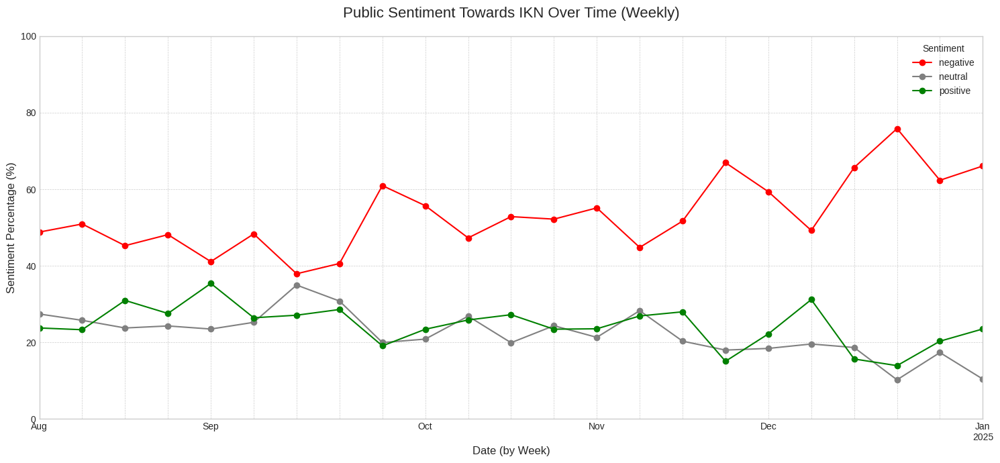

In [ ]:
# Cell 5: Perform and Plot Temporal Analysis (FINAL CORRECTED VERSION)
import matplotlib.pyplot as plt
import pandas as pd
import os

print("\n--- Stage 3: Performing Temporal Analysis ---")

# Using the `df_to_predict` DataFrame which is the output of Cell 4
temporal_df = df_to_predict.copy()

# Define the date column name
DATE_COLUMN = 'created_at'

# Convert the date column with the correct format
date_format = '%a %b %d %H:%M:%S %z %Y'
temporal_df[DATE_COLUMN] = pd.to_datetime(temporal_df[DATE_COLUMN], errors='coerce', format=date_format)

# Drop rows with invalid dates or empty sentiments
temporal_df.dropna(subset=[DATE_COLUMN, 'sentiment'], inplace=True)

# --- LANGUAGE CORRECTION: Matching the filter with the data ('Positive', 'Negative', 'Neutral') ---
sentiments_to_plot = ['positive', 'negative', 'neutral'] # Changed to English
temporal_df = temporal_df[temporal_df['sentiment'].str.lower().isin(sentiments_to_plot)]

# Check if the DataFrame is empty after filtering
print(f"\nNumber of rows after sentiment filter: {len(temporal_df)}")

# Only proceed if there is data to plot
if not temporal_df.empty:
    temporal_df.set_index(DATE_COLUMN, inplace=True)

    # Resample data by week and count sentiments
    # Using .str.lower() for consistency
    sentiment_over_time = temporal_df.groupby([pd.Grouper(freq='W'), temporal_df['sentiment'].str.lower()]).size().unstack(fill_value=0)

    # Calculate percentage
    sentiment_percentage = sentiment_over_time.apply(lambda x: 100 * x / x.sum() if x.sum() > 0 else x, axis=1)

    # --- Plotting Results ---
    fig, ax = plt.subplots(figsize=(15, 7))

    # --- LANGUAGE CORRECTION: Adjusting the color dictionary ---
    colors = {'positive': 'green', 'negative': 'red', 'neutral': 'grey'} # Changed to English

    # Ensure the color order matches the columns
    plot_colors = [colors.get(c.lower()) for c in sentiment_percentage.columns]

    sentiment_percentage.plot(kind='line', ax=ax, marker='o', linestyle='-', color=plot_colors)

    ax.set_title('Public Sentiment Towards IKN Over Time (Weekly)', fontsize=16, pad=20)
    ax.set_ylabel('Sentiment Percentage (%)', fontsize=12)
    ax.set_xlabel('Date (by Week)', fontsize=12)
    ax.set_ylim(0, 100)
    ax.legend(title='Sentiment')
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    plt.tight_layout()

    # Saving the plot image
    figure_path = os.path.join(GDRIVE_PATH, 'temporal_analysis_plot.png')
    plt.savefig(figure_path, dpi=300, bbox_inches='tight')
    print(f"\n✅ Plot saved to: {figure_path}")
    plt.show()
else:
    print("\n❌ WARNING: No matching sentiment data was found after filtering. The plot cannot be created.")

--- Installing required libraries ---

--- Loading final labeled data ---
✅ Successfully loaded 67641 labeled tweets.

--- Preparing stopwords ---
Total of 813 stopwords will be used.

--- Generating word clouds for each smart city dimension ---

Processing aspect: Smart Economy


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


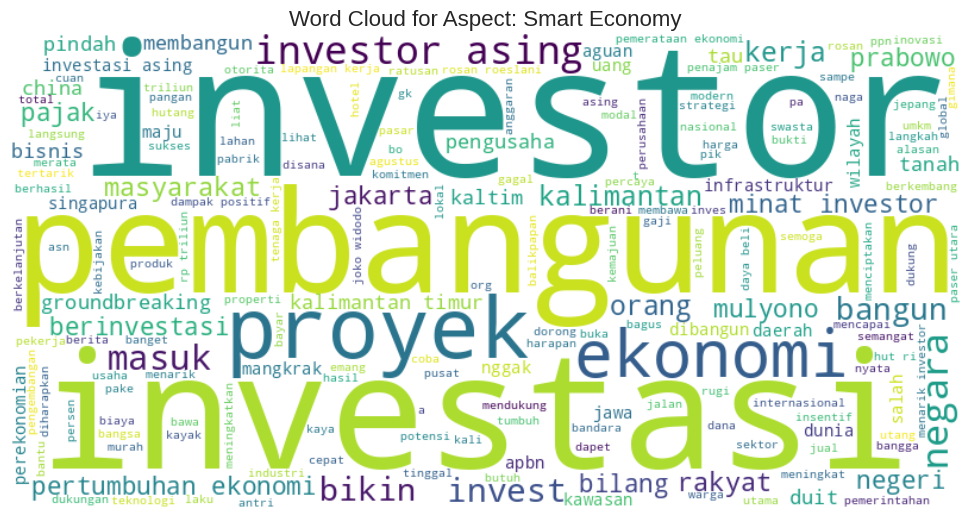


Processing aspect: Smart Governance


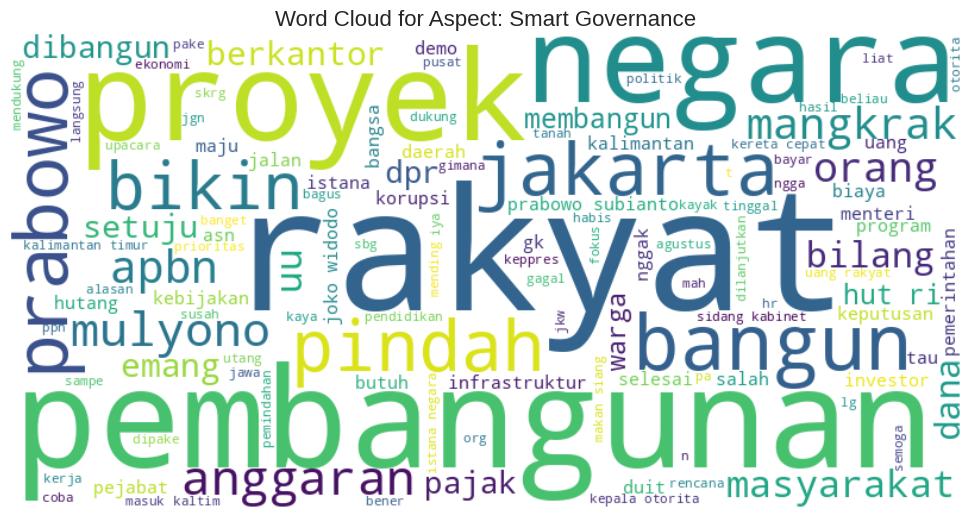


Processing aspect: Smart Environment


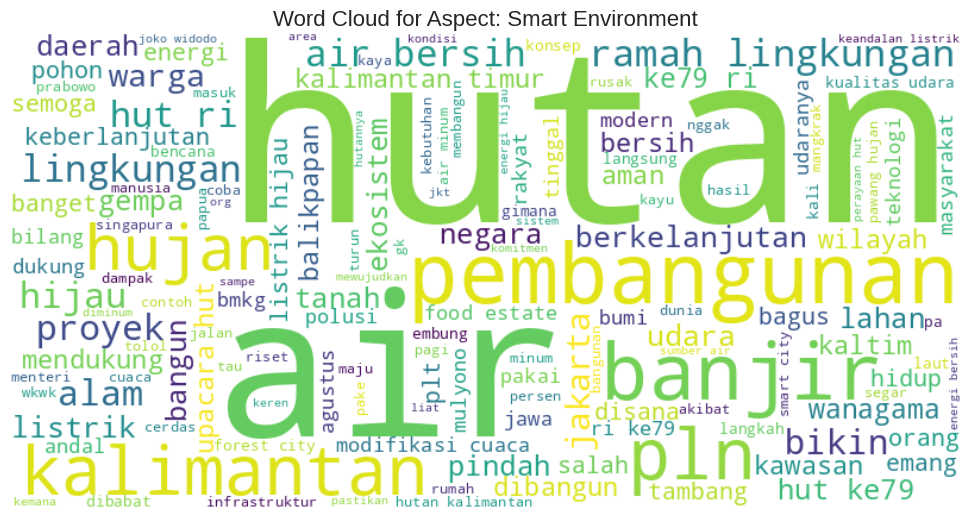


Processing aspect: Smart Living


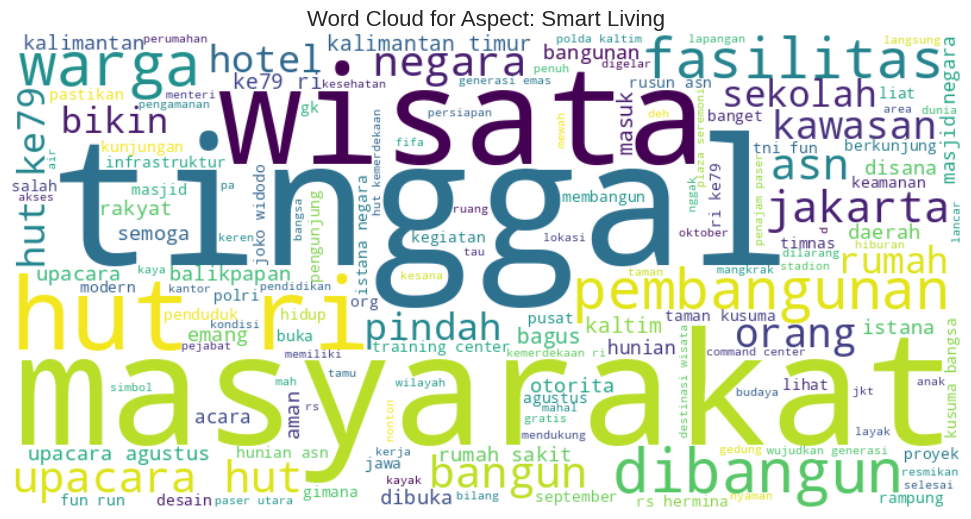


Processing aspect: Smart Mobility


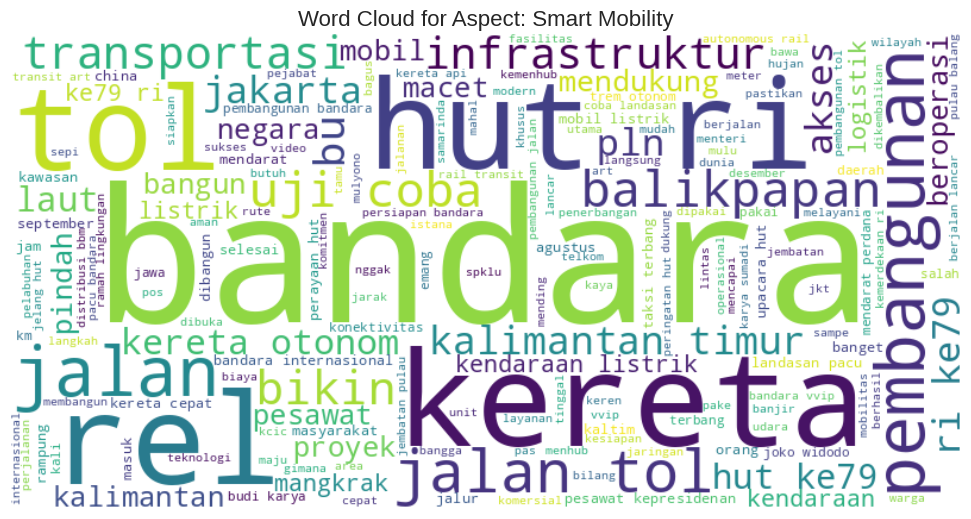


Processing aspect: Smart People


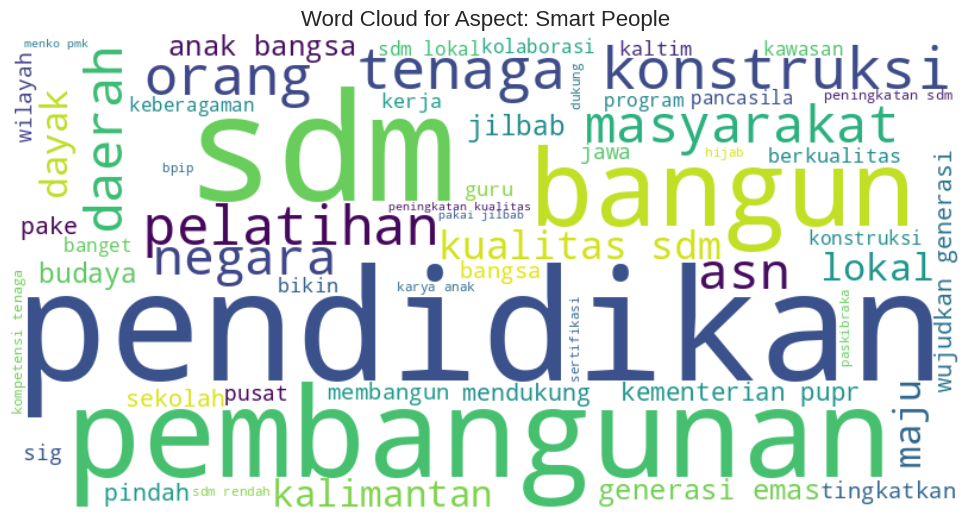


✅ Word cloud generation complete.


In [ ]:
# Cell 6: Generate Word Clouds per Smart City Dimension (REVISED)

# --- 1. Install necessary libraries ---
print("--- Installing required libraries ---")
!pip install wordcloud nltk -q

import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
import os

# --- 2. Setup and Data Loading ---
print("\n--- Loading final labeled data ---")

# Load the final labeled data file you created in the previous steps
labeled_data_path = os.path.join(GDRIVE_PATH, FINAL_LABELED_OUTPUT_FILE)
try:
    df_labeled = pd.read_csv(labeled_data_path)
    print(f"✅ Successfully loaded {len(df_labeled)} labeled tweets.")
except FileNotFoundError:
    print(f"❌ ERROR: File not found at '{labeled_data_path}'. Please make sure you have run the prediction cell.")
    raise

# --- 3. Prepare Stopwords ---
print("\n--- Preparing stopwords ---")

# *** CORRECTED SECTION STARTS HERE ***
# Directly download the stopwords corpus.
# nltk.download is smart; it won't re-download if it's already present.
nltk.download('stopwords')
# *** CORRECTED SECTION ENDS HERE ***

# Load the standard Indonesian stopwords
from nltk.corpus import stopwords
standard_stopwords = set(stopwords.words('indonesian'))

# This is where you add your own words to ignore
custom_stopwords = {
    "yg", "ga", "gak", "aja", "sih", "kak", "nya", "dgn", "gaes", "guys",
    "dpt", "utk", "kalo", "klo", "udh", "udah", "blm", "belum", "tdk", "tidak",
    "ikn", "nusantara", "ibu", "kota", "ibukota", "jokowi", "pemerintah", "presiden",
    "baru", "indonesia", "jadi", "akan", "ts", "gue", "gw", "gua", "loe", "lu", "ya",
    "dah", "tp", "dr", "amp", "tuh", "jd", "dg", "bgt", "biar", "sdh", "gini", "si",
        "kau", "dll", "bgt", "biar", "doang", "karna", "krn", "jg", "nih", "lo", "mah"
        "sampe", "gitu", "lagi", "kek"
}

# Combine both sets of stopwords for a complete list
all_stopwords = standard_stopwords.union(custom_stopwords)
print(f"Total of {len(all_stopwords)} stopwords will be used.")


# --- 4. Generate Word Cloud for Each Aspect ---
print("\n--- Generating word clouds for each smart city dimension ---")

# Get a list of the relevant aspects to plot (excluding 'Irrelevant')
aspects_to_plot = [aspect for aspect in df_labeled['aspect'].unique() if aspect != 'Irrelevant']

for aspect in aspects_to_plot:
    print(f"\nProcessing aspect: {aspect}")

    # Filter the DataFrame for the current aspect
    df_aspect = df_labeled[df_labeled['aspect'] == aspect]

    # Combine all text for this aspect into one single string
    text = ' '.join(df_aspect[TEXT_COLUMN].dropna())

    # Check if there is any text to plot for this aspect
    if not text.strip():
        print(f"  No text found for aspect '{aspect}'. Skipping.")
        continue

    # Create the WordCloud object
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        stopwords=all_stopwords,
        colormap='viridis',
        min_font_size=10
    ).generate(text)

    # Plot the WordCloud image
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'Word Cloud for Aspect: {aspect}', fontsize=16)
    plt.tight_layout(pad=0)
    plt.show()

print("\n✅ Word cloud generation complete.")

--- Preparing to generate sentiment-specific word clouds ---

--- Generating word clouds... ---

Processing Aspect: Smart Economy
  -> Generating 'Positive' word cloud...


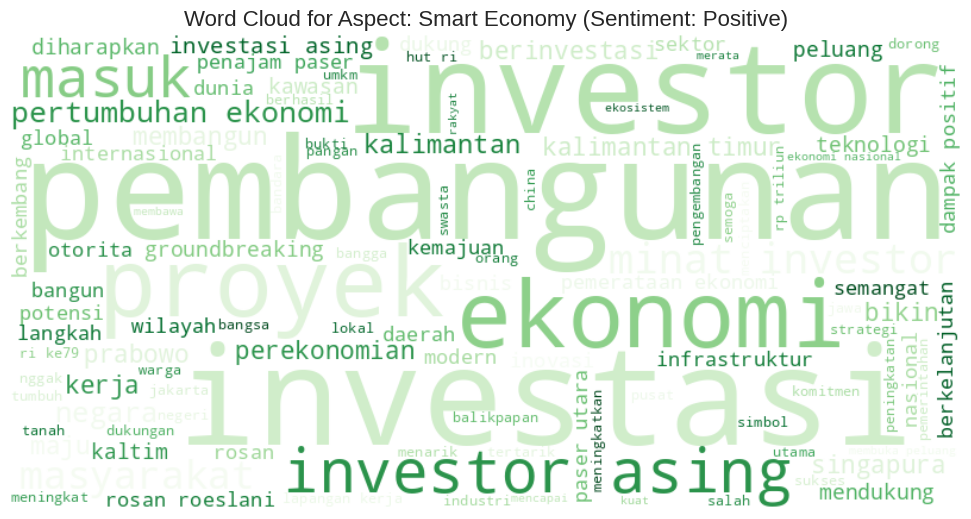

  -> Generating 'Negative' word cloud...


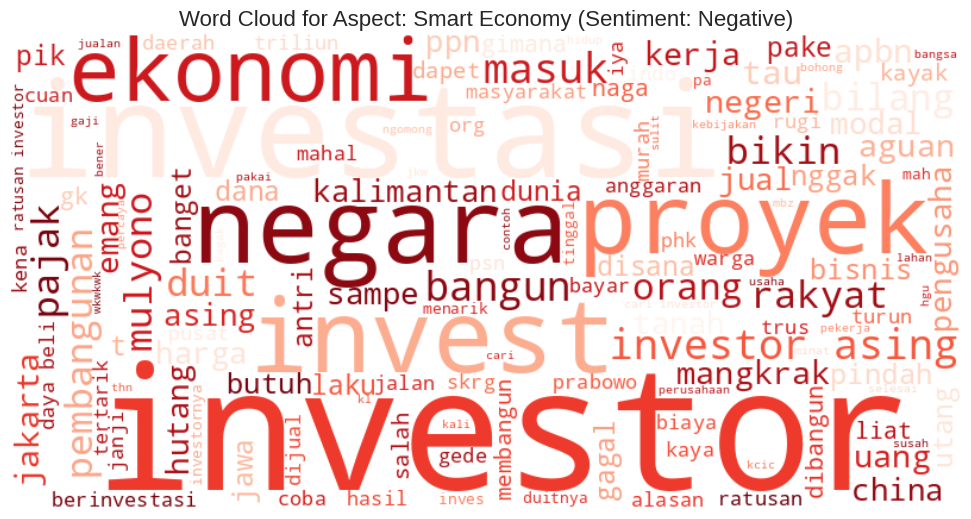

  -> Generating 'Neutral' word cloud...


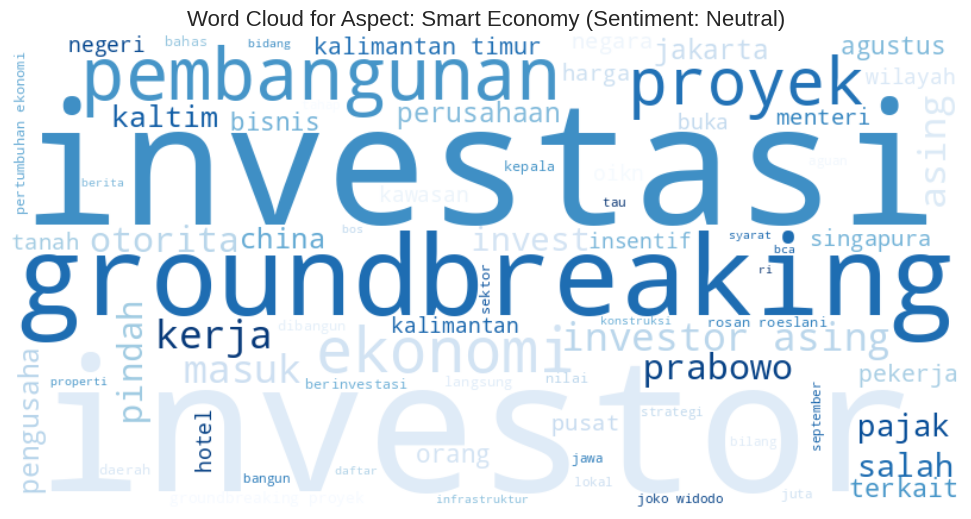


Processing Aspect: Smart Governance
  -> Generating 'Positive' word cloud...


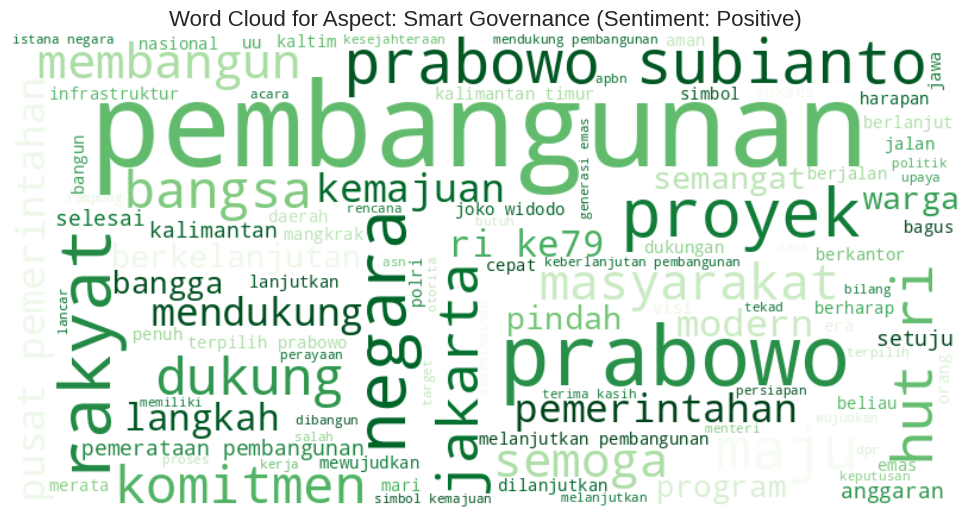

  -> Generating 'Negative' word cloud...


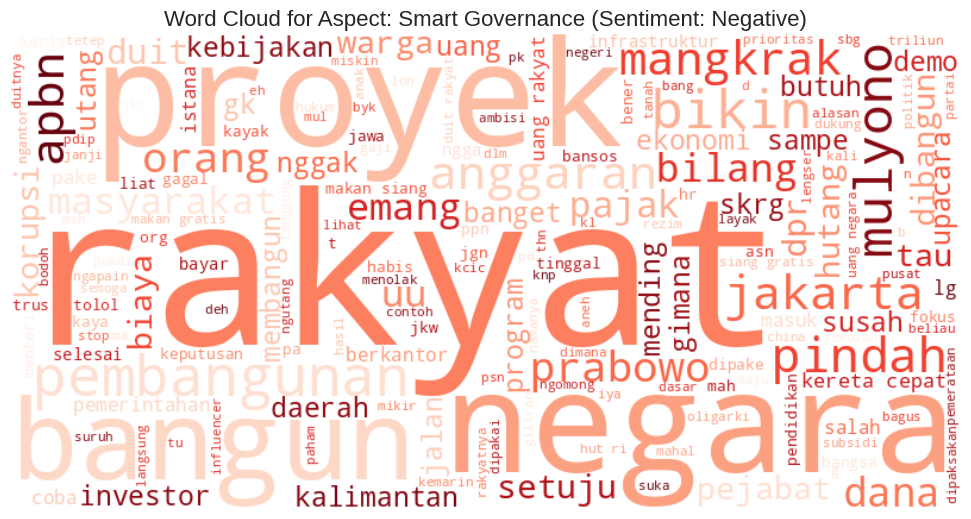

  -> Generating 'Neutral' word cloud...


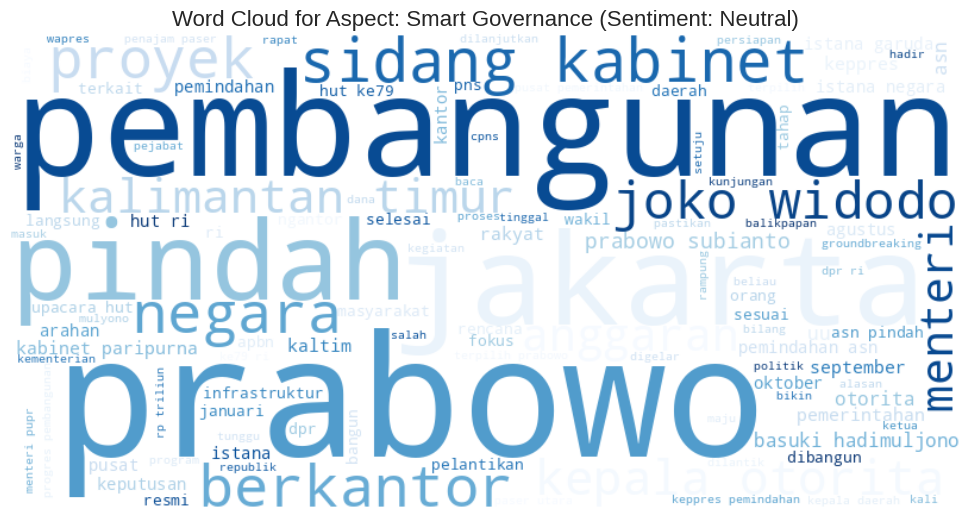


Processing Aspect: Smart Environment
  -> Generating 'Positive' word cloud...


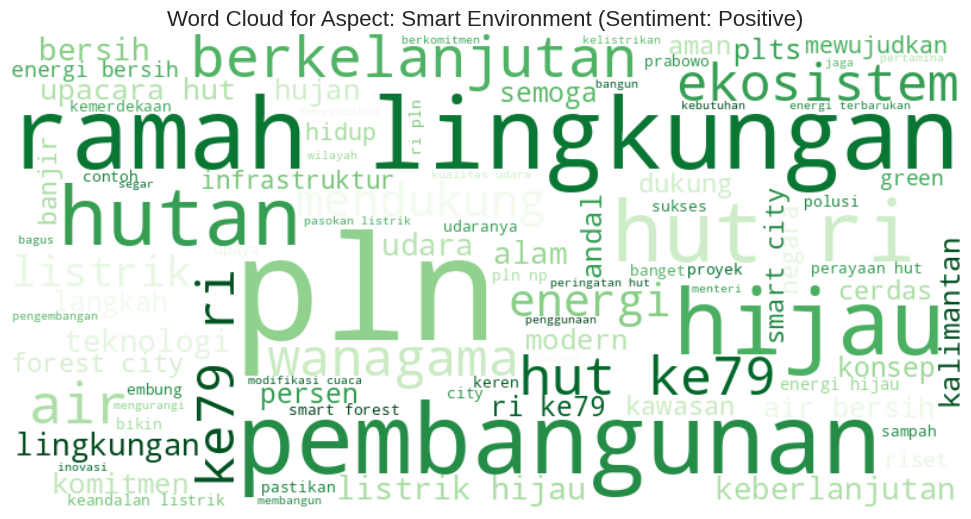

  -> Generating 'Negative' word cloud...


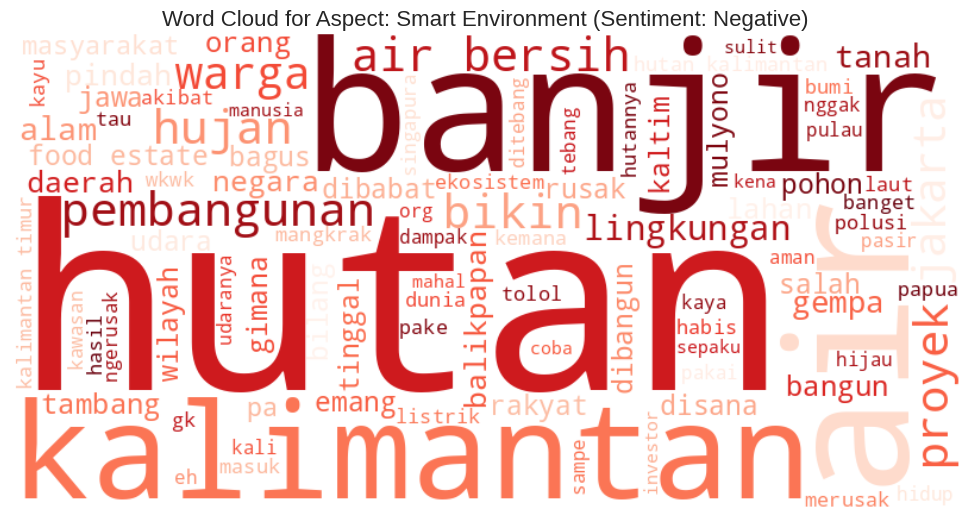

  -> Generating 'Neutral' word cloud...


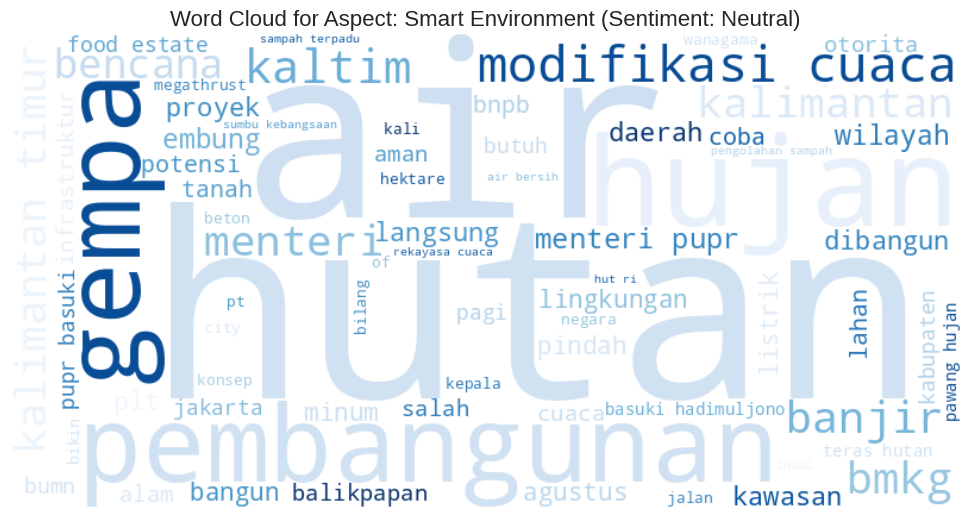


Processing Aspect: Smart Living
  -> Generating 'Positive' word cloud...


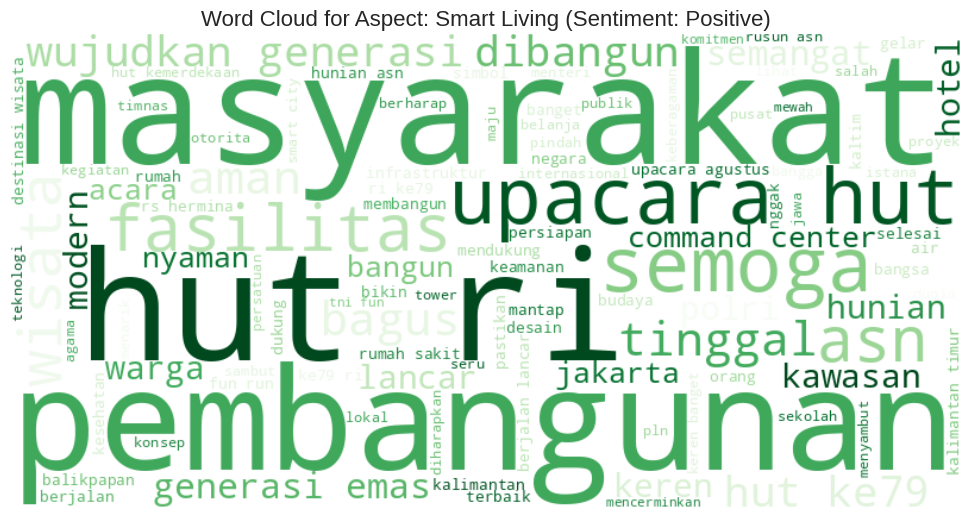

  -> Generating 'Negative' word cloud...


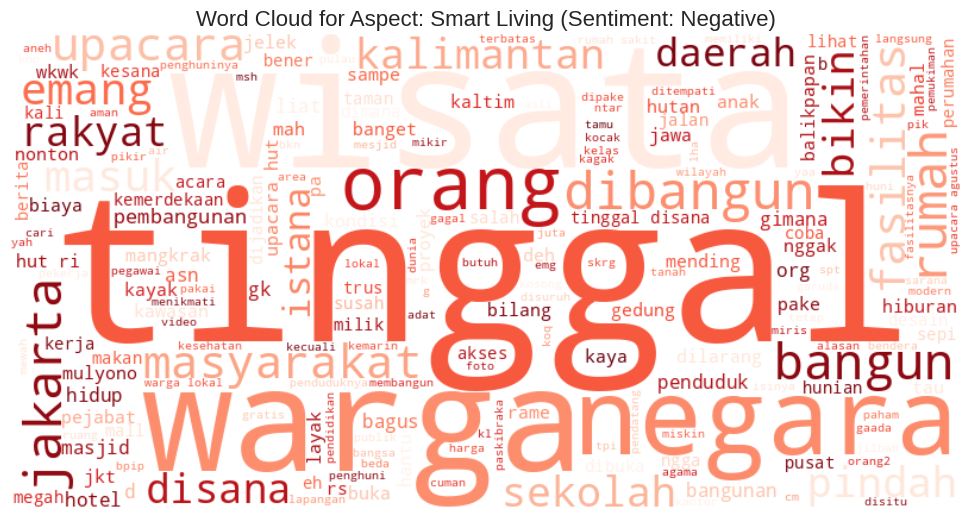

  -> Generating 'Neutral' word cloud...


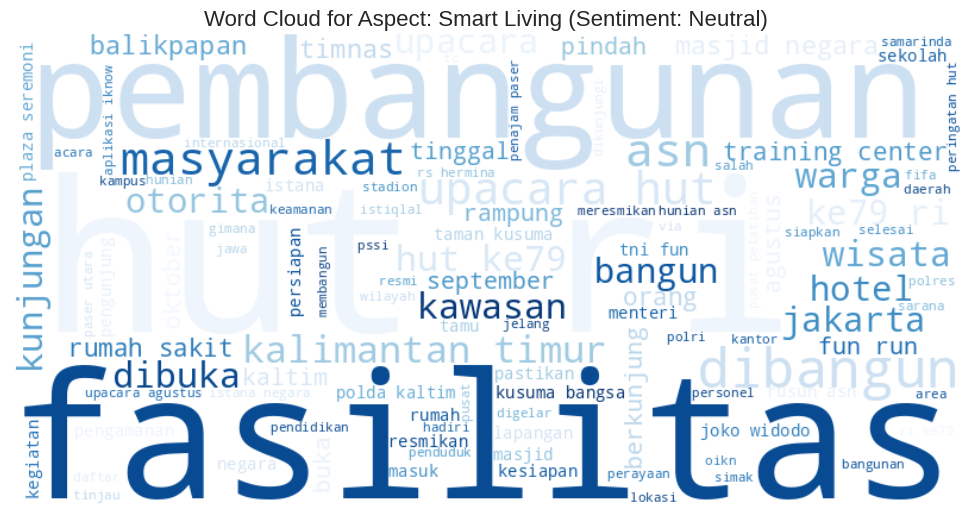


Processing Aspect: Smart Mobility
  -> Generating 'Positive' word cloud...


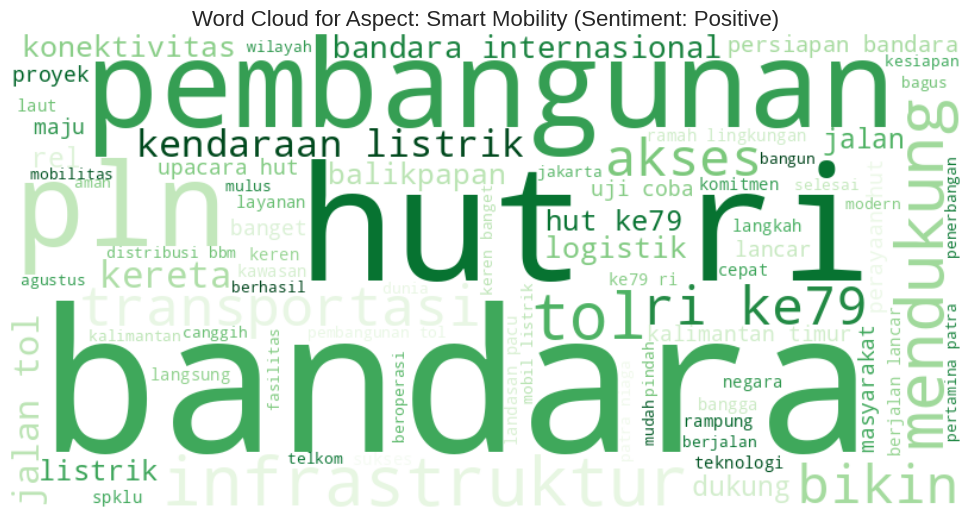

  -> Generating 'Negative' word cloud...


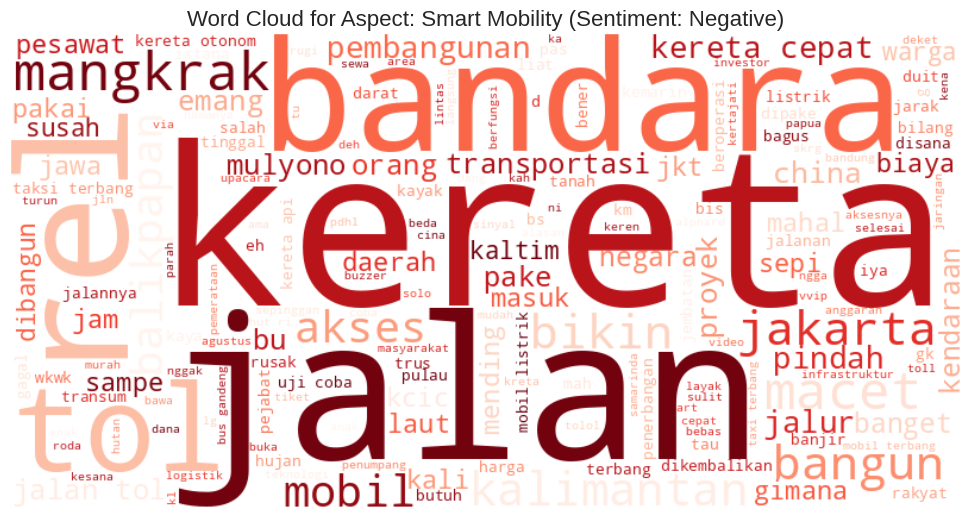

  -> Generating 'Neutral' word cloud...


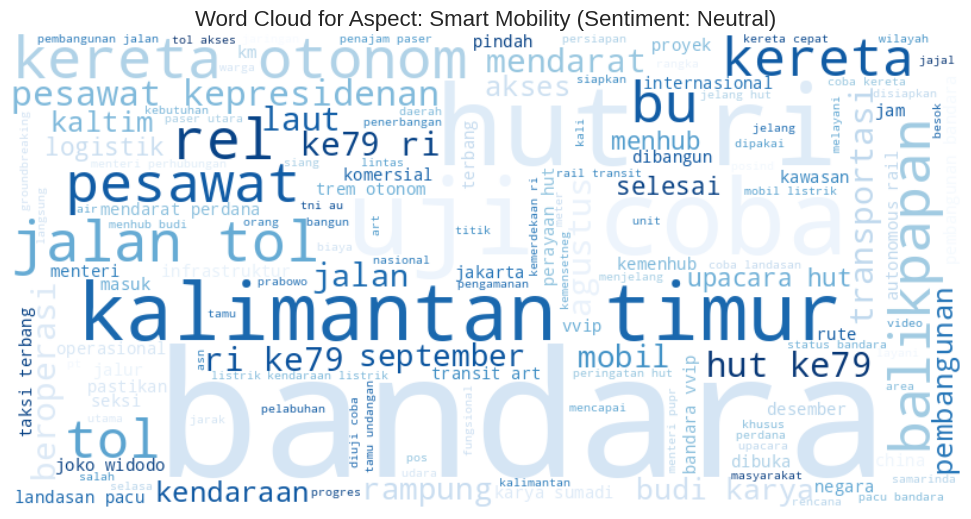


Processing Aspect: Smart People
  -> Generating 'Positive' word cloud...


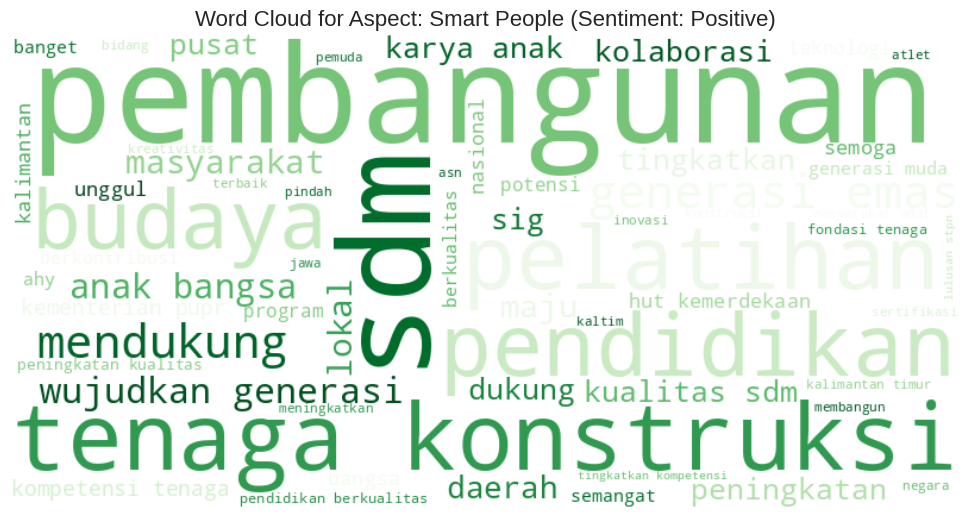

  -> Generating 'Negative' word cloud...


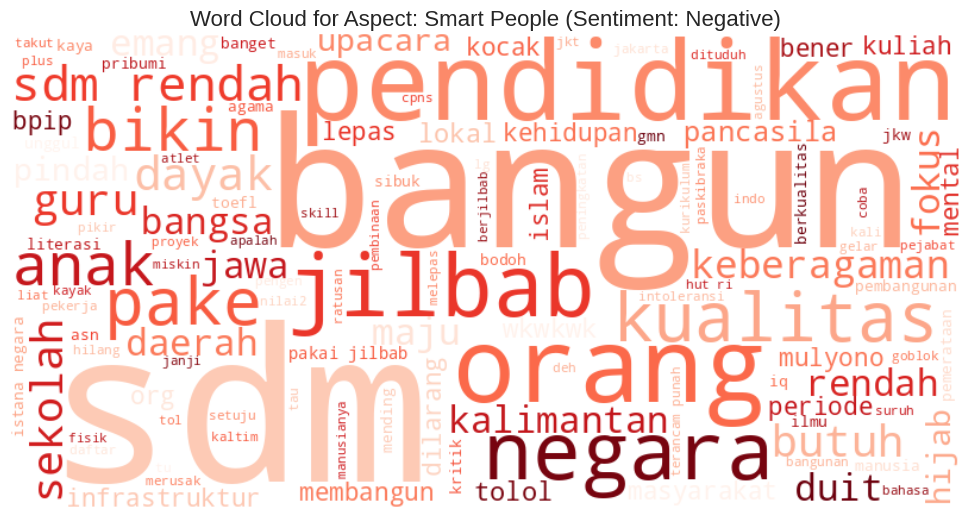

  -> Generating 'Neutral' word cloud...


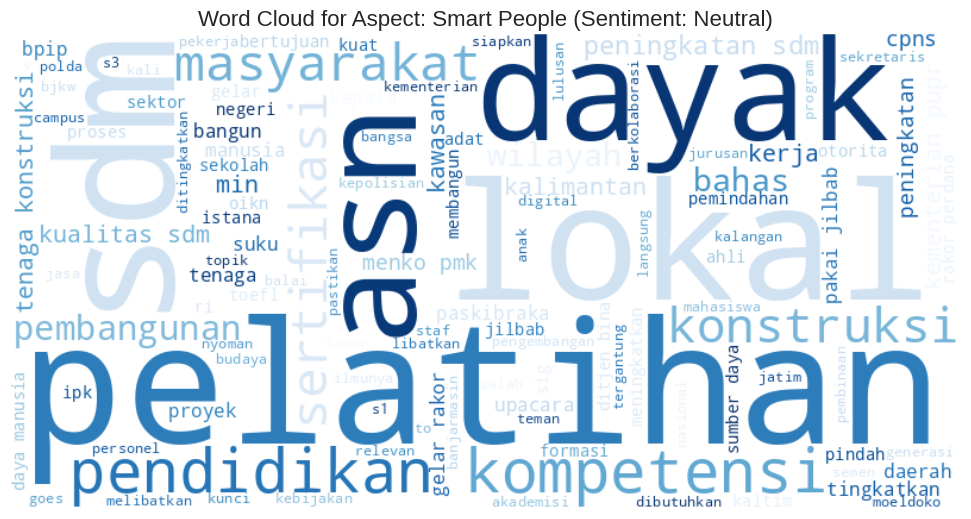


✅ All sentiment-specific word cloud generations complete.


In [ ]:
# Cell 7: Generate Word Clouds per Aspect and per Sentiment

# --- 1. Ensure libraries are installed and imported ---
# (Assuming they are already imported from the previous cell)
print("--- Preparing to generate sentiment-specific word clouds ---")

# --- 2. Setup and Data Loading ---
# (Assuming df_labeled is already loaded from the previous cell)
if 'df_labeled' not in locals():
    print("Loading final labeled data...")
    labeled_data_path = os.path.join(GDRIVE_PATH, FINAL_LABELED_OUTPUT_FILE)
    try:
        df_labeled = pd.read_csv(labeled_data_path)
        print(f"✅ Successfully loaded {len(df_labeled)} labeled tweets.")
    except FileNotFoundError:
        print(f"❌ ERROR: File not found at '{labeled_data_path}'. Please run the previous cells first.")
        raise

# (Assuming all_stopwords is already prepared from the previous cell)
if 'all_stopwords' not in locals():
    print("Preparing stopwords...")
    nltk.download('stopwords')
    from nltk.corpus import stopwords
    standard_stopwords = set(stopwords.words('indonesian'))
    custom_stopwords = {
        "yg", "ga", "gak", "aja", "sih", "kak", "nya", "dgn", "gaes", "guys",
        "dpt", "utk", "kalo", "klo", "udh", "udah", "blm", "belum", "tdk", "tidak",
        "ikn", "nusantara", "ibu", "kota", "ibukota", "jokowi", "pemerintah", "presiden",
        "baru", "indonesia", "jadi", "akan", "ts", "gue", "gw", "gua", "loe", "lu", "ya",
        "dah", "tp", "dr", "amp", "tuh", "jd", "dg", "bgt", "biar", "sdh", "gini", "si",
        "kau", "dll", "bgt", "biar", "doang", "karna", "krn", "jg", "nih", "lo", "mah"
        "sampe", "gitu", "lagi", "kek"
    }
    all_stopwords = standard_stopwords.union(custom_stopwords)

# --- 3. Define Color and Sentiment Mappings ---
# This dictionary maps each sentiment to a specific color palette (colormap)
sentiment_color_map = {
    'Positive': 'Greens',
    'Negative': 'Reds',
    'Neutral': 'Blues'
}
sentiments_to_plot = ['Positive', 'Negative', 'Neutral']
aspects_to_plot = [aspect for aspect in df_labeled['aspect'].unique() if aspect != 'Irrelevant']

# --- 4. Generate Word Clouds in a Nested Loop ---
print("\n--- Generating word clouds... ---")

for aspect in aspects_to_plot:
    print(f"\n=================================================")
    print(f"Processing Aspect: {aspect}")
    print(f"=================================================")

    for sentiment in sentiments_to_plot:

        # Filter the DataFrame for the current aspect AND sentiment
        df_subset = df_labeled[(df_labeled['aspect'] == aspect) & (df_labeled['sentiment'] == sentiment)]

        # Combine all text for this subset into one single string
        text = ' '.join(df_subset[TEXT_COLUMN].dropna())

        # Check if there is any text to plot for this combination
        if not text.strip():
            print(f"  -> No '{sentiment}' sentiment text found for aspect '{aspect}'. Skipping.")
            continue

        print(f"  -> Generating '{sentiment}' word cloud...")

        # Create the WordCloud object with the specified colormap
        wordcloud = WordCloud(
            width=800,
            height=400,
            background_color='white',
            stopwords=all_stopwords,
            colormap=sentiment_color_map[sentiment], # Use the color map here
            min_font_size=10
        ).generate(text)

        # Plot the WordCloud image
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        # Create a more specific title
        plt.title(f'Word Cloud for Aspect: {aspect} (Sentiment: {sentiment})', fontsize=16)
        plt.tight_layout(pad=0)
        plt.show()

print("\n✅ All sentiment-specific word cloud generations complete.")

In [ ]:
# Cell to Generate Separate Word Frequency Tables per Aspect

# --- 1. Import required library ---
from sklearn.feature_extraction.text import CountVectorizer

print("--- Preparing to generate separate word frequency tables per aspect ---")

# --- 2. Setup (assuming df_labeled, all_stopwords, TEXT_COLUMN are loaded) ---
if 'df_labeled' not in locals() or 'all_stopwords' not in locals():
    print("One or more required variables ('df_labeled', 'all_stopwords') not found. Please run the previous cells.")
    raise NameError("Required variables are not defined.")

# --- 3. Create a list of relevant aspects ---
aspects_to_analyze = [aspect for aspect in df_labeled['aspect'].unique() if aspect != 'Irrelevant']

# --- 4. Initialize the Word Counter ---
# We use CountVectorizer to get raw word counts.
vectorizer = CountVectorizer(stop_words=list(all_stopwords))

# --- 5. Loop through each aspect, create and display a table for each ---
for aspect in aspects_to_analyze:

    # Filter DataFrame for the current aspect
    df_aspect = df_labeled[df_labeled['aspect'] == aspect]

    # Skip if there's no data
    if df_aspect.empty or df_aspect[TEXT_COLUMN].dropna().empty:
        print(f"\n--- No data to process for Aspect: {aspect} ---")
        continue

    # Create the word frequency matrix
    word_freq_matrix = vectorizer.fit_transform(df_aspect[TEXT_COLUMN].dropna())

    # Create a DataFrame with words and their frequencies
    word_counts = pd.DataFrame({
        'Word': vectorizer.get_feature_names_out(),
        'Frequency': word_freq_matrix.sum(axis=0).getA1()
    }).set_index('Word')

    # Sort the table to show the most frequent words at the top
    word_counts.sort_values(by='Frequency', ascending=False, inplace=True)

    # Display the table for the current aspect
    print(f"\n--- Top 20 Keywords for Aspect: {aspect} ---")
    display(word_counts.head(20))

print("\n✅ All tables have been generated.")

--- Preparing to generate separate word frequency tables per aspect ---


/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(



--- Top 20 Keywords for Aspect: Smart Economy ---


,Frequency
Word,
investor,1586
investasi,1002
ekonomi,693
pembangunan,685
asing,457
proyek,402
negara,297
masuk,282
kerja,276



--- Top 20 Keywords for Aspect: Smart Governance ---


,Frequency
Word,
rakyat,4454
pembangunan,2933
negara,2570
proyek,1916
prabowo,1859
bangun,1413
jakarta,1236
anggaran,1213
pindah,1183



--- Top 20 Keywords for Aspect: Smart Environment ---


,Frequency
Word,
air,412
hutan,391
lingkungan,260
pembangunan,213
listrik,204
kalimantan,201
pln,195
ri,180
banjir,176



--- Top 20 Keywords for Aspect: Smart Living ---


,Frequency
Word,
upacara,437
hut,339
ri,331
wisata,276
tinggal,272
asn,250
negara,242
masyarakat,230
rumah,227



--- Top 20 Keywords for Aspect: Smart Mobility ---


,Frequency
Word,
bandara,916
kereta,487
tol,474
jalan,413
ri,373
hut,364
pembangunan,328
rel,244
pesawat,235



--- Top 20 Keywords for Aspect: Smart People ---


,Frequency
Word,
sdm,99
pendidikan,52
pembangunan,41
konstruksi,39
tenaga,35
generasi,31
masyarakat,31
kualitas,31
peningkatan,30



✅ All tables have been generated.


In [ ]:
# Cell to Generate Separate Word Frequency Tables per Aspect and Sentiment

print("\n--- Preparing to generate detailed word frequency tables per aspect and sentiment ---")

# --- 1. Setup ---
sentiments_to_analyze = ['Positive', 'Negative', 'Neutral']
aspects_to_analyze = [aspect for aspect in df_labeled['aspect'].unique() if aspect != 'Irrelevant']

# --- 2. Initialize the Word Counter ---
vectorizer = CountVectorizer(stop_words=list(all_stopwords))

# --- 3. Nested loop to process and display a table for each combination ---
for aspect in aspects_to_analyze:
    print(f"\n=============================================")
    print(f"Analyzing Aspect: {aspect}")
    print(f"=============================================")

    for sentiment in sentiments_to_analyze:

        # Filter DataFrame for the current aspect AND sentiment
        df_subset = df_labeled[(df_labeled['aspect'] == aspect) & (df_labeled['sentiment'] == sentiment)]

        # Skip if there's no data for this combination
        if df_subset.empty or df_subset[TEXT_COLUMN].dropna().empty:
            continue

        # Create the word frequency matrix for the current subset
        word_freq_matrix = vectorizer.fit_transform(df_subset[TEXT_COLUMN].dropna())

        # Create a DataFrame with words and their frequencies
        word_counts = pd.DataFrame({
            'Word': vectorizer.get_feature_names_out(),
            'Frequency': word_freq_matrix.sum(axis=0).getA1()
        }).set_index('Word')

        # Sort the table
        word_counts.sort_values(by='Frequency', ascending=False, inplace=True)

        # Display the table for the current combination
        print(f"\n--- Top 15 Keywords for {aspect} ({sentiment}) ---")
        display(word_counts.head(15))

print("\n✅ All detailed tables have been generated.")


--- Preparing to generate detailed word frequency tables per aspect and sentiment ---

Analyzing Aspect: Smart Economy

--- Top 15 Keywords for Smart Economy (Positive) ---


/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(


,Frequency
Word,
investor,651
investasi,574
pembangunan,527
ekonomi,448
asing,199
proyek,198
kalimantan,140
pusat,139
minat,138



--- Top 15 Keywords for Smart Economy (Negative) ---


,Frequency
Word,
investor,779
investasi,323
asing,194
ekonomi,192
negara,190
invest,167
proyek,151
masuk,131
bangun,119



--- Top 15 Keywords for Smart Economy (Neutral) ---


,Frequency
Word,
investor,156
investasi,105
asing,64
groundbreaking,63
proyek,53
ekonomi,53
pembangunan,49
kerja,40
prabowo,35



Analyzing Aspect: Smart Governance

--- Top 15 Keywords for Smart Governance (Positive) ---


,Frequency
Word,
pembangunan,1250
prabowo,606
negara,279
pemerintahan,240
proyek,237
ri,234
rakyat,222
bangsa,199
hut,194



--- Top 15 Keywords for Smart Governance (Negative) ---


,Frequency
Word,
rakyat,4054
negara,1870
proyek,1445
bangun,1263
pembangunan,1112
apbn,1019
anggaran,904
bikin,875
uang,854



--- Top 15 Keywords for Smart Governance (Neutral) ---


,Frequency
Word,
prabowo,686
pembangunan,571
negara,421
menteri,365
asn,359
pindah,353
jakarta,353
kabinet,330
otorita,330



Analyzing Aspect: Smart Environment

--- Top 15 Keywords for Smart Environment (Positive) ---


,Frequency
Word,
pln,188
listrik,172
lingkungan,165
ri,150
hijau,150
hut,139
energi,122
air,119
pembangunan,115



--- Top 15 Keywords for Smart Environment (Negative) ---


,Frequency
Word,
hutan,272
air,247
banjir,139
kalimantan,128
lingkungan,85
hujan,81
bersih,74
pembangunan,67
gempa,63



--- Top 15 Keywords for Smart Environment (Neutral) ---


,Frequency
Word,
hutan,52
air,46
hujan,36
cuaca,35
pembangunan,31
kalimantan,30
menteri,28
gempa,26
modifikasi,21



Analyzing Aspect: Smart Living

--- Top 15 Keywords for Smart Living (Positive) ---


,Frequency
Word,
upacara,146
hut,142
ri,122
asn,81
pembangunan,81
masyarakat,80
ke79,69
hunian,69
wisata,63



--- Top 15 Keywords for Smart Living (Negative) ---


,Frequency
Word,
tinggal,185
wisata,137
warga,120
upacara,115
orang,89
negara,88
rumah,84
dibangun,75
jakarta,72



--- Top 15 Keywords for Smart Living (Neutral) ---


,Frequency
Word,
upacara,176
ri,165
hut,154
asn,136
2024,129
negara,109
pembangunan,104
fasilitas,92
kalimantan,88



Analyzing Aspect: Smart Mobility

--- Top 15 Keywords for Smart Mobility (Positive) ---


,Frequency
Word,
bandara,309
pembangunan,186
tol,184
ri,180
hut,176
infrastruktur,139
pln,135
listrik,132
mendukung,121



--- Top 15 Keywords for Smart Mobility (Negative) ---


,Frequency
Word,
kereta,243
jalan,180
bandara,134
rel,133
tol,128
mobil,74
mangkrak,70
macet,68
kalimantan,61



--- Top 15 Keywords for Smart Mobility (Neutral) ---


,Frequency
Word,
bandara,473
ri,178
kereta,174
hut,173
pesawat,166
tol,162
jalan,131
coba,116
uji,110



Analyzing Aspect: Smart People

--- Top 15 Keywords for Smart People (Positive) ---


,Frequency
Word,
sdm,34
pembangunan,29
generasi,27
tenaga,24
konstruksi,24
pendidikan,22
bangsa,21
pelatihan,17
masyarakat,17



--- Top 15 Keywords for Smart People (Negative) ---


,Frequency
Word,
sdm,41
bangun,22
jilbab,21
pendidikan,21
orang,19
negara,18
rendah,15
kualitas,12
pake,11



--- Top 15 Keywords for Smart People (Neutral) ---


,Frequency
Word,
sdm,24
konstruksi,15
pelatihan,12
peningkatan,12
dayak,11
lokal,11
tenaga,10
asn,10
sertifikasi,9



✅ All detailed tables have been generated.
